[![Roboflow Notebooks](https://ik.imagekit.io/roboflow/notebooks/template/bannertest2-2.png?ik-sdk-version=javascript-1.4.3&updatedAt=1672932710194)](https://github.com/roboflow/notebooks)

# How to Detect and Count Objects in Zone

---

## Accompanying Blog Post

We recommend that you follow along in this notebook while reading the blog post on how to train YOLOv8 Object Detection, concurrently.

## Pro Tip: Use GPU Acceleration

If you are running this notebook in Google Colab, navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`. This will ensure your notebook uses a GPU, which will significantly speed up model training times.

## Steps in this Tutorial

In this tutorial, we are going to cover:

- Before you start
- Install YOLOv5
- Install YOLOv8
- Install Supervision
- Download data
- Simple YOLOv8 Shopping Mall Example
- Simple YOLOv8 Subway Example
- Advanced YOLOv5 Market Square Example
- Congratulations

**Let's begin!**

## Başlamadan önce 

Google Colab GPU'sunu kullanıp kullanamadığımıza bakalım.

In [1]:
!nvidia-smi

Tue Mar 14 22:15:14 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   56C    P0    27W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## YOLOv5 ve YOLOv8 algoritmaları PyTorch ile yazıldığı için PyTorch kütüphanesini import ediyoruz. Ardından GPU'muzun kullandığı CUDA sürümüne ve PyTorch'un sürümüne bakıyoruz.

In [2]:
import torch
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0
torch:  1.13 ; cuda:  cu116


## os kütüphanesini import ediyoruz

In [3]:
import os
HOME = os.getcwd() # os kütüphanesinin şuanda çalışılan yeri str cinsinden verdiği fonksiyon
print(HOME)

/content


## YOLOv5'i indiriyoruz

In [4]:
%cd {HOME}
!git clone https://github.com/ultralytics/yolov5 # yolov5 algoritmasını github üzerinden çekiyoruz

%cd {HOME}/yolov5
!pip install -r requirements.txt # yolov5'in çalışması için varolması gereken kütüphaneleri pip ile indiriyoruz

from IPython import display # komut bloğu çalıştırıldıktan sonra çıktıları temizleyerek görüntü kalabalığını yok eden fonksiyon
display.clear_output()

## YOLOv8'i indiriyoruz

In [5]:
!pip install ultralytics # yolov8 algoritmasını pip ile indiriyoruz

from IPython import display # komut bloğu çalıştırıldıktan sonra çıktıları temizleyerek görüntü kalabalığını yok eden fonksiyon
display.clear_output()

import ultralytics # ultralytics kütüphanesini import ediyoruz
ultralytics.checks() # checks fonksiyonu ile yolov8 sürümü, python sürümü, torch sürümü, CUDA:0 indexi gibi bilgileri alıyoruz
                     # buna ek olarak cpu sayısı, ram miktarı, depolama miktarı gibi bilgileri de alıyoruz

Ultralytics YOLOv8.0.53 🚀 Python-3.9.16 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 25.5/78.2 GB disk)




## Detectron2'yi indiriyoruz

In [6]:
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'  # Facebook araştırma birimi tarafından yapılan detectron2 kütüphanesini pip kullanarak github üzerinden çekiyoruz

from IPython import display # komut bloğu çalıştırıldıktan sonra çıktıları temizleyerek görüntü kalabalığını yok eden fonksiyon
display.clear_output()

import detectron2 # detectron kütüphanesini import ediyoruz
print("detectron2:", detectron2.__version__) # detectron versiyonuna bakıyoruz

detectron2: 0.6


## Supervision kütüphanesini indiriyoruz

In [7]:
!pip install supervision==0.2.0 # roboflow tarafından yazılan supervision kütüphanesini indiriyoruz.
                                # bu kütüphane görüntü işleme projeleri için bazı faydalı fonksiyonları ve yapıları barındırıyor

from IPython import display # komut bloğu çalıştırıldıktan sonra çıktıları temizleyerek görüntü kalabalığını yok eden fonksiyon
display.clear_output()

import supervision as sv
print("supervision", sv.__version__) # supervision sürümüne bakıyoruz

supervision 0.2.0


## Projede kullanılacak olan verileri indiriyoruz

In [8]:
%cd {HOME}
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1vVrEVMxucHgqGd7vAa501ASojbeGPhIr' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1vVrEVMxucHgqGd7vAa501ASojbeGPhIr" -O market-square.mp4 && rm -rf /tmp/cookies.txt

/content
--2023-03-14 22:19:52--  https://docs.google.com/uc?export=download&confirm=&id=1vVrEVMxucHgqGd7vAa501ASojbeGPhIr
Resolving docs.google.com (docs.google.com)... 173.194.192.101, 173.194.192.102, 173.194.192.113, ...
Connecting to docs.google.com (docs.google.com)|173.194.192.101|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0k-ag-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/vm22nfjirfuj125r9shf7t71pb0vo7lh/1678832325000/04309230031174164349/*/1vVrEVMxucHgqGd7vAa501ASojbeGPhIr?e=download&uuid=9d982cd9-ae02-4a07-827a-d8ecfc1a6f98 [following]
--2023-03-14 22:19:53--  https://doc-0k-ag-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/vm22nfjirfuj125r9shf7t71pb0vo7lh/1678832325000/04309230031174164349/*/1vVrEVMxucHgqGd7vAa501ASojbeGPhIr?e=download&uuid=9d982cd9-ae02-4a07-827a-d8ecfc1a6f98
Resolving doc-0k-ag-docs.googleusercontent.com (doc-0k-ag-docs.googleusercontent.com)... 108.

In [9]:
MARKET_SQUARE_VIDEO_PATH = f"{HOME}/market-square.mp4" # market alanı videosunu değişkene atadık

In [10]:
%cd {HOME}
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1M3UuH3QNDWGiH0NmGgHtIgXXGDo_nigm' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1M3UuH3QNDWGiH0NmGgHtIgXXGDo_nigm" -O mall.mp4 && rm -rf /tmp/cookies.txt

/content
--2023-03-14 22:19:57--  https://docs.google.com/uc?export=download&confirm=&id=1M3UuH3QNDWGiH0NmGgHtIgXXGDo_nigm
Resolving docs.google.com (docs.google.com)... 173.194.192.101, 173.194.192.102, 173.194.192.113, ...
Connecting to docs.google.com (docs.google.com)|173.194.192.101|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0c-ag-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/es3n1bc0uucl1i7cpddp789e2n53g51l/1678832325000/04309230031174164349/*/1M3UuH3QNDWGiH0NmGgHtIgXXGDo_nigm?e=download&uuid=b2d3f685-cb28-4b26-b470-1fb5c19f5718 [following]
--2023-03-14 22:19:59--  https://doc-0c-ag-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/es3n1bc0uucl1i7cpddp789e2n53g51l/1678832325000/04309230031174164349/*/1M3UuH3QNDWGiH0NmGgHtIgXXGDo_nigm?e=download&uuid=b2d3f685-cb28-4b26-b470-1fb5c19f5718
Resolving doc-0c-ag-docs.googleusercontent.com (doc-0c-ag-docs.googleusercontent.com)... 108.

In [11]:
MALL_VIDEO_PATH = f"{HOME}/mall.mp4" # mall videosunu değişkene atadık

In [12]:
%cd {HOME}
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1qZ6ROKdzHbQiHdizKfYbecr9qquOQ0Cz' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1qZ6ROKdzHbQiHdizKfYbecr9qquOQ0Cz" -O subway.mp4 && rm -rf /tmp/cookies.txt

/content
--2023-03-14 22:20:00--  https://docs.google.com/uc?export=download&confirm=t&id=1qZ6ROKdzHbQiHdizKfYbecr9qquOQ0Cz
Resolving docs.google.com (docs.google.com)... 173.194.192.101, 173.194.192.102, 173.194.192.113, ...
Connecting to docs.google.com (docs.google.com)|173.194.192.101|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-00-ag-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/eh5l01q74qs25ahuaii7dn5d4h87of0o/1678832400000/04309230031174164349/*/1qZ6ROKdzHbQiHdizKfYbecr9qquOQ0Cz?e=download&uuid=1b92cc0a-94b5-4458-a4e8-43ee3c151df3 [following]
--2023-03-14 22:20:01--  https://doc-00-ag-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/eh5l01q74qs25ahuaii7dn5d4h87of0o/1678832400000/04309230031174164349/*/1qZ6ROKdzHbQiHdizKfYbecr9qquOQ0Cz?e=download&uuid=1b92cc0a-94b5-4458-a4e8-43ee3c151df3
Resolving doc-00-ag-docs.googleusercontent.com (doc-00-ag-docs.googleusercontent.com)... 108

In [13]:
SUBWAY_VIDEO_PATH = f"{HOME}/subway.mp4" # subway videosunu değişkene atadık

## Simple YOLOv8 Shopping Mall Example

In [14]:
from ultralytics import YOLO # ultralytics kütüphanesinin YOLO sınıfını çağırdık

model = YOLO('yolov8s.pt') # model değişkenini YOLO('yolov8s.pt') sınıfına atadık, bu yapı bize girdi olarak aldığı ağırlığı indiriyor

  0%|          | 0.00/21.5M [00:00<?, ?B/s]

**NOTE:** Let's start vanilla YOLOv8 inference pipeline. 


0: 736x1280 1 person, 4 bottles, 1 chair, 1 tv, 2 refrigerators, 31.2ms
Speed: 1.1ms preprocess, 31.2ms inference, 26.5ms postprocess per image at shape (1, 3, 1280, 1280)


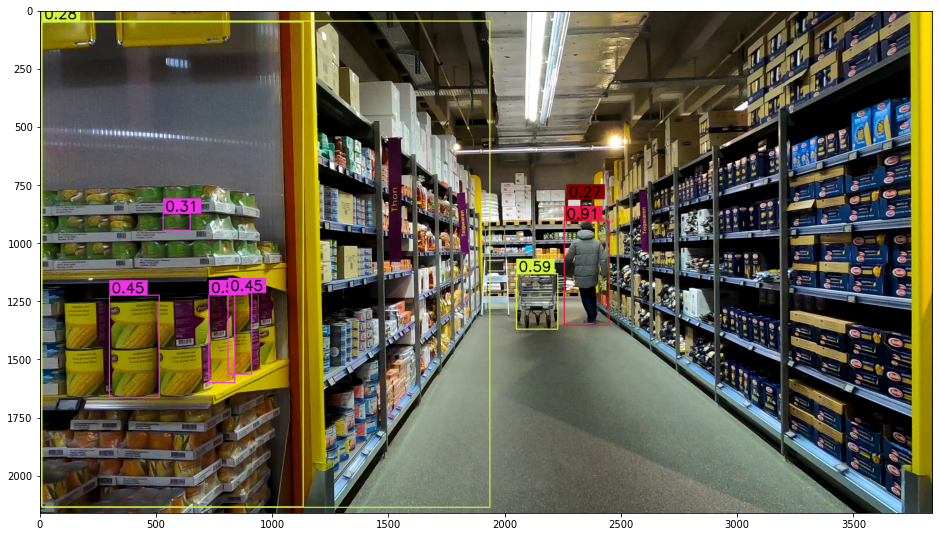

In [15]:
import supervision as sv

# extract video frame
generator = sv.get_video_frames_generator(MALL_VIDEO_PATH) # videoyu framelere ayıran supervision fonksiyonu
iterator = iter(generator) # iterator değişkenine atadığımız iter fonksiyonu içine aldığı parametreyi yenilenebilir, içinde gezilebilir hale getirir ve next fonksiyonu ile bağlantılı çalışır
frame = next(iterator) # next fonksiyonu iterden aldığı içinde gezilebilir nesnelerin içinde bir sonrakine geçer ve bu sayede döngü sağlanır

# detect
results = model(frame, imgsz=1280)[0] # results değişkenine yukarıda tanımladığımız model fonksiyonunu atadık, modelin içine test edilecek görsel ve istenilen çıktı boyutunu verdik

detections = sv.Detections.from_yolov8(results) # supervision kütüphanesinin Detections sınıfında girdik ve from_yolov8 fonksiyonunu çalıştırdık, bu fonksiyon bize
                                                # sırasıyla bbox konumlarını, confidence değerini ve class_id sini verir

# annotate
box_annotator = sv.BoxAnnotator(thickness=4, text_thickness=4, text_scale=2) # supervision'un BoxAnnotator fonksiyonu ile frame üzerine çizdirilecek olan bboxların kalınlığını
                                                                             # sınıf textinin kalınlığını ve yazı boyutunu parametre olarak alır

frame = box_annotator.annotate(scene=frame, detections=detections) # annotate fonksiyonu ile detections ile aldığımız bbox, conf değeri ve class id değerini frame üzerine çiziyoruz

%matplotlib inline  
sv.show_frame_in_notebook(frame, (16, 16)) # supervision kütüphanesinin show_frame_in_notebook fonksiyonu ile görseli ekrana tahmin görselini ekrana çıkarıyoruz

**NOTE:** In this demo, our goal is primarily to detect people. Therefore, let's filter out detections related to other classes. By the way, we can also replace our bounding box labels with more human-friendly ones.


0: 736x1280 1 person, 4 bottles, 1 chair, 1 tv, 2 refrigerators, 30.5ms
Speed: 1.1ms preprocess, 30.5ms inference, 1.7ms postprocess per image at shape (1, 3, 1280, 1280)


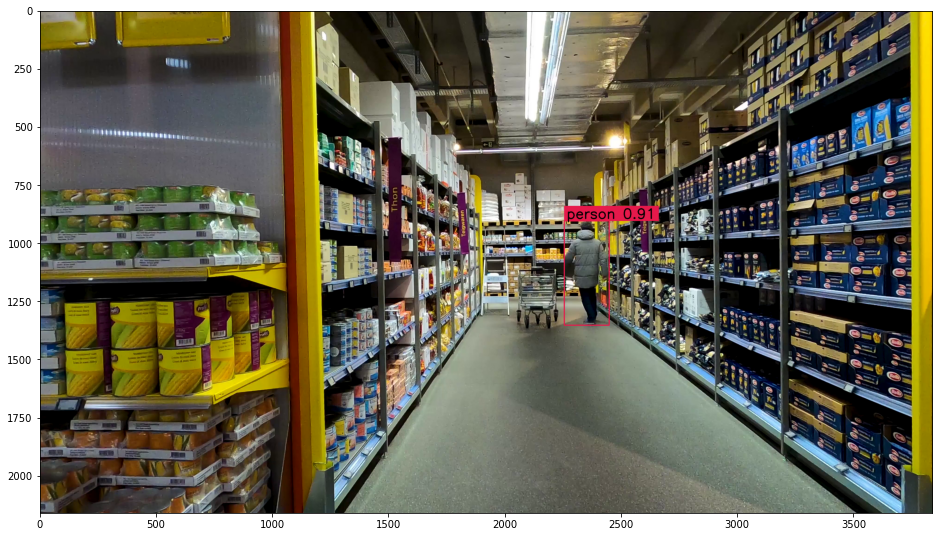

In [16]:
import supervision as sv

# extract video frame
generator = sv.get_video_frames_generator(MALL_VIDEO_PATH)
iterator = iter(generator)
frame = next(iterator)

# detect
results = model(frame, imgsz=1280)[0]
detections = sv.Detections.from_yolov8(results)
detections = detections[detections.class_id == 0] # sadece class_id'si 0 olan verilere ait bbox ve conf değerlerini alıyoruz

# annotate
box_annotator = sv.BoxAnnotator(thickness=4, text_thickness=4, text_scale=2)
labels = [f"{model.names[class_id]} {confidence:0.2f}" for _, confidence, class_id, _ in detections]
frame = box_annotator.annotate(scene=frame, detections=detections, labels=labels)

%matplotlib inline  
sv.show_frame_in_notebook(frame, (16, 16))

**NOTE:** Now we can add a polygon zone to the scene and visualize it.

In [17]:
sv.VideoInfo.from_video_path(MALL_VIDEO_PATH) # supervision kütüphanesinin VideoInfo sınıfına giriyoruz ve from_video_path fonksiyonu ile videoya ait
                                              # width, height, fps ve toplam frame sayısı gibi bilgileri alıyoruz

VideoInfo(width=3840, height=2160, fps=29, total_frames=1002)


0: 736x1280 1 person, 4 bottles, 1 chair, 1 tv, 2 refrigerators, 30.9ms
Speed: 2.2ms preprocess, 30.9ms inference, 2.0ms postprocess per image at shape (1, 3, 1280, 1280)


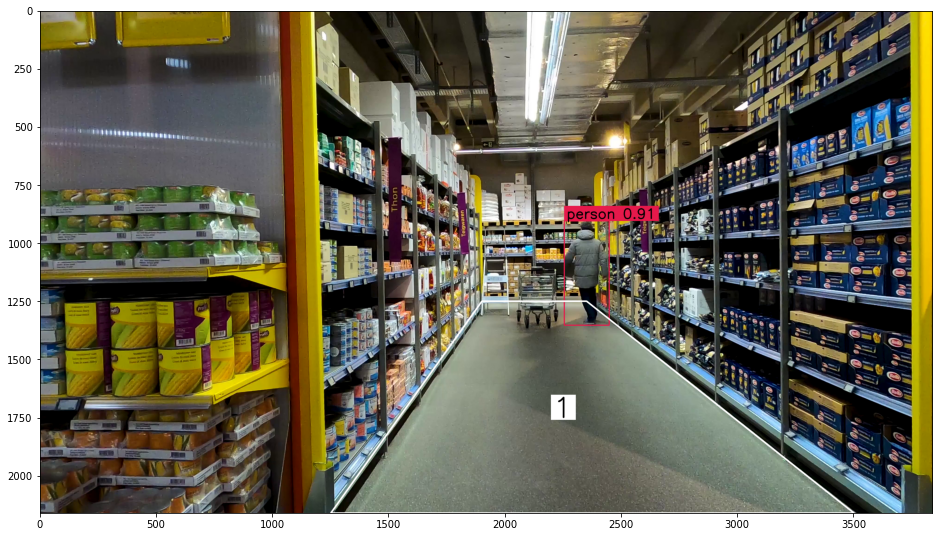

In [18]:
import numpy as np # numerik, boyutsal işlemler için numpy kütüphanesini çağırıyoruz
import supervision as sv

# initiate polygon zone
# poligon alanı oluşturmak için bir numpy dizisine [x1,y1], [x2,y2], .... , [xn, yn] şeklinde noktalar tanımlıyoruz
polygon = np.array([
    [1900, 1250],
    [2350, 1250],
    [3500, 2160],
    [1250, 2160]
])
video_info = sv.VideoInfo.from_video_path(MALL_VIDEO_PATH)
zone = sv.PolygonZone(polygon=polygon, frame_resolution_wh=video_info.resolution_wh) # supervision kütüphanesinin PolygonZone fonksiyonuna parametre olarak
                                                                                     # poligon noktalarına ait konum bilgileri ve frame'in width, height cinsinden çözünürlük bilgilerini veriyoruz

# initiate annotators
box_annotator = sv.BoxAnnotator(thickness=4, text_thickness=4, text_scale=2)
zone_annotator = sv.PolygonZoneAnnotator(zone=zone, color=sv.Color.white(), thickness=6, text_thickness=6, text_scale=4) # bu fonksiyon poligon alanını görselin üzerine çizdiriyor

# extract video frame
generator = sv.get_video_frames_generator(MALL_VIDEO_PATH)
iterator = iter(generator)
frame = next(iterator)

# detect
results = model(frame, imgsz=1280)[0]
detections = sv.Detections.from_yolov8(results)
detections = detections[detections.class_id == 0]
zone.trigger(detections=detections) # zone.trigger ile alana giren bir sınıf olduğu alanın tetiklenmesini sağlıyoruz

# annotate
box_annotator = sv.BoxAnnotator(thickness=4, text_thickness=4, text_scale=2)
labels = [f"{model.names[class_id]} {confidence:0.2f}" for _, confidence, class_id, _ in detections]
frame = box_annotator.annotate(scene=frame, detections=detections, labels=labels)
frame = zone_annotator.annotate(scene=frame) # zone tetiklendiğinde ekrana yansıtılması yapılıyor

%matplotlib inline  
sv.show_frame_in_notebook(frame, (16, 16))

**NOTE:** Note the number 1 visible in the middle of the zone we painted. Now let's try changing its location and see what happens. 


0: 736x1280 1 person, 4 bottles, 1 chair, 1 tv, 2 refrigerators, 31.0ms
Speed: 1.1ms preprocess, 31.0ms inference, 1.9ms postprocess per image at shape (1, 3, 1280, 1280)


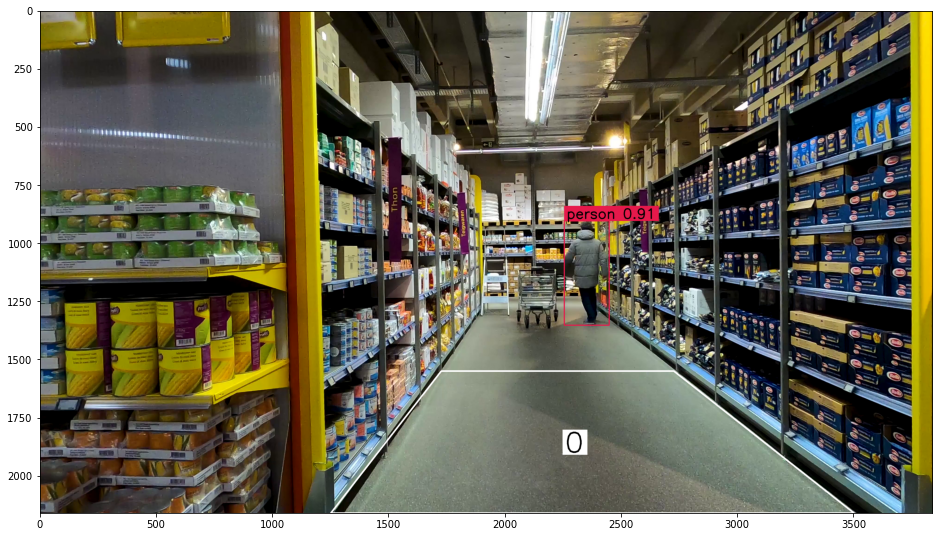

In [19]:
import numpy as np
import supervision as sv

# initiate polygon zone
polygon = np.array([
    [1725, 1550],
    [2725, 1550],
    [3500, 2160],
    [1250, 2160]
])
video_info = sv.VideoInfo.from_video_path(MALL_VIDEO_PATH)
zone = sv.PolygonZone(polygon=polygon, frame_resolution_wh=video_info.resolution_wh)

# initiate annotators
box_annotator = sv.BoxAnnotator(thickness=4, text_thickness=4, text_scale=2)
zone_annotator = sv.PolygonZoneAnnotator(zone=zone, color=sv.Color.white(), thickness=6, text_thickness=6, text_scale=4)

# extract video frame
generator = sv.get_video_frames_generator(MALL_VIDEO_PATH)
iterator = iter(generator)
frame = next(iterator)

# detect
results = model(frame, imgsz=1280)[0]
detections = sv.Detections.from_yolov8(results)
detections = detections[detections.class_id == 0]
zone.trigger(detections=detections)

# annotate
box_annotator = sv.BoxAnnotator(thickness=4, text_thickness=4, text_scale=2)
labels = [f"{model.names[class_id]} {confidence:0.2f}" for _, confidence, class_id, _ in detections]
frame = box_annotator.annotate(scene=frame, detections=detections, labels=labels)
frame = zone_annotator.annotate(scene=frame)

%matplotlib inline  
sv.show_frame_in_notebook(frame, (16, 16))

**NOTE:** Note that now no person is in the zone, and consequently the counter still indicates zero.

Now let's try to process the whole video.

In [20]:
import numpy as np
import supervision as sv

# initiate polygon zone
polygon = np.array([
    [1725, 1550],
    [2725, 1550],
    [3500, 2160],
    [1250, 2160]
])
video_info = sv.VideoInfo.from_video_path(MALL_VIDEO_PATH)
zone = sv.PolygonZone(polygon=polygon, frame_resolution_wh=video_info.resolution_wh)

# initiate annotators
box_annotator = sv.BoxAnnotator(thickness=4, text_thickness=4, text_scale=2)
zone_annotator = sv.PolygonZoneAnnotator(zone=zone, color=sv.Color.white(), thickness=6, text_thickness=6, text_scale=4)

def process_frame(frame: np.ndarray, _) -> np.ndarray:
    # detect
    results = model(frame, imgsz=1280)[0]
    detections = sv.Detections.from_yolov8(results)
    detections = detections[detections.class_id == 0]
    zone.trigger(detections=detections)

    # annotate
    box_annotator = sv.BoxAnnotator(thickness=4, text_thickness=4, text_scale=2)
    labels = [f"{model.names[class_id]} {confidence:0.2f}" for _, confidence, class_id, _ in detections]
    frame = box_annotator.annotate(scene=frame, detections=detections, labels=labels)
    frame = zone_annotator.annotate(scene=frame)

    return frame

sv.process_video(source_path=MALL_VIDEO_PATH, target_path=f"{HOME}/mall-result.mp4", callback=process_frame)

from IPython import display
display.clear_output()

## Simple Detectron2 Subway Example

In [21]:
from detectron2 import model_zoo # detectron, içinde çok sayıda nesne tespiti, segmentasyon ve poz tahmini ön eğitimli modeli barındıran bir yapıdır
                                 # bu ön eğitimli ağırlıkları kullanmak için model_zoo sınıfını kullanıyoruz

from detectron2.config import get_cfg # get_cfg fonksiyonu parametre olarak kullanılacak olan ön eğitimli modele ait .yaml dosyasınının yolunu alır
from detectron2.engine import DefaultPredictor # detectron2'nin tahmin üretme motorunu import ediyoruz


cfg = get_cfg() # cfg değişkenine get_cfg() fonksiyonunu atıyoruz
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")) # coco veri setiyle eğitilmiş bir instance segmentation modeli olan mask r-cnn modeline ait cfg dosyasını veriyoruz
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 # modelin sadece 0.5 ve üzerindeki tahminleri göstermesi için bir eşik değeri belirliyoruz
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml") # ön eğitimli modelin cfg'sini verdikten sonra ağırlıklarını da veriyoruz
predictor = DefaultPredictor(cfg) # predictor değişkenine tahmin üretme motorunu cfg parametresiyle atıyoruz

model_final_f10217.pkl: 178MB [00:07, 23.0MB/s]                           


**NOTE:** Let's start vanilla YOLOv8 inference pipeline.

/usr/local/lib/python3.9/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


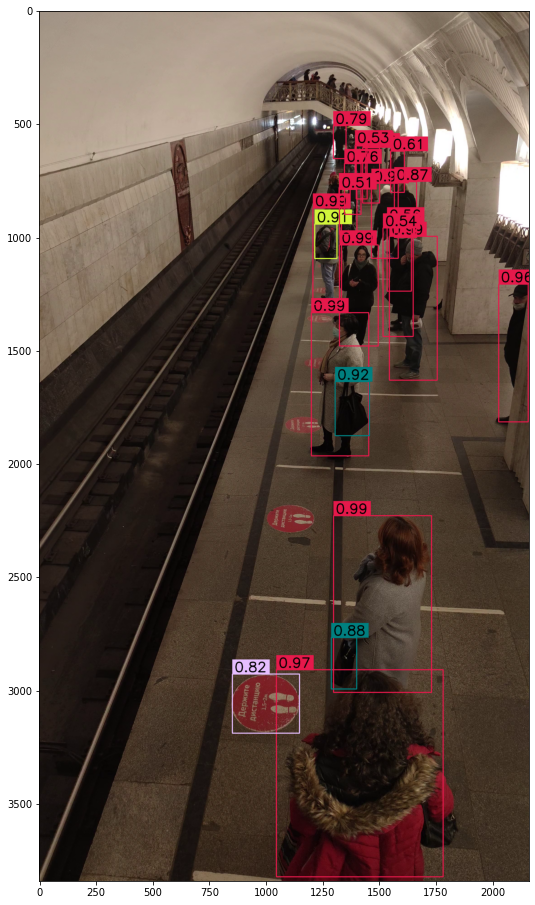

In [22]:
import supervision as sv

# extract video frame
generator = sv.get_video_frames_generator(SUBWAY_VIDEO_PATH)
iterator = iter(generator)
frame = next(iterator)

# detect
outputs = predictor(frame) ###### buradaki tahmin işlemi yolov8 ağırlığı ile değil, detectron2'de bulunan mask r-cnn modeli ile yapılmıştır
detections = sv.Detections(
    xyxy=outputs["instances"].pred_boxes.tensor.cpu().numpy(),
    confidence=outputs["instances"].scores.cpu().numpy(),
    class_id=outputs["instances"].pred_classes.cpu().numpy().astype(int)
)

# annotate
box_annotator = sv.BoxAnnotator(thickness=4, text_thickness=4, text_scale=2)
frame = box_annotator.annotate(scene=frame, detections=detections)

%matplotlib inline  
sv.show_frame_in_notebook(frame, (16, 16))

**NOTE:** Once again, we have a lot of excess detections that we are not interested in. Let us remove all those not belonging to the person class and hide labels for better visibility.

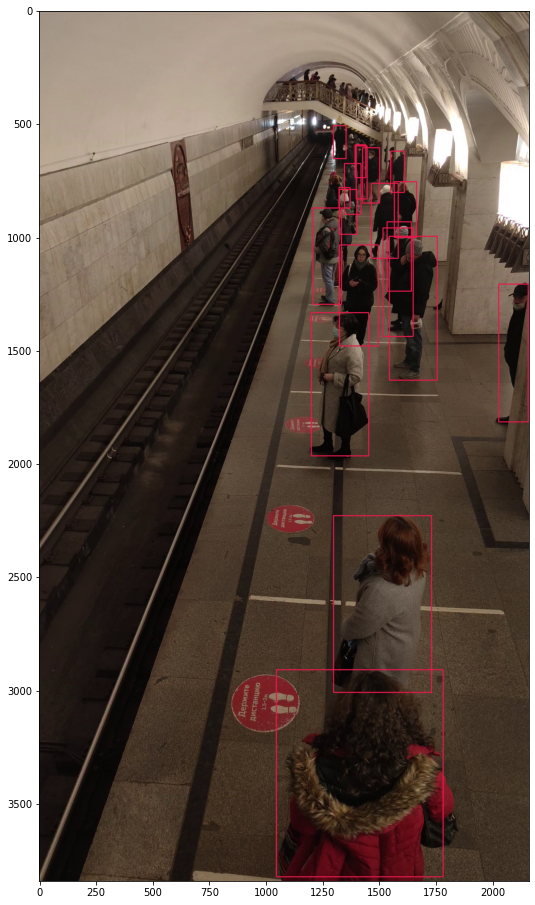

In [23]:
import supervision as sv

# extract video frame
generator = sv.get_video_frames_generator(SUBWAY_VIDEO_PATH)
iterator = iter(generator)
frame = next(iterator)

# detect
outputs = predictor(frame)
detections = sv.Detections(
    xyxy=outputs["instances"].pred_boxes.tensor.cpu().numpy(),
    confidence=outputs["instances"].scores.cpu().numpy(),
    class_id=outputs["instances"].pred_classes.cpu().numpy().astype(int)
)
detections = detections[detections.class_id == 0]

# annotate
box_annotator = sv.BoxAnnotator(thickness=4, text_thickness=4, text_scale=2)
frame = box_annotator.annotate(scene=frame, detections=detections, skip_label=True)

%matplotlib inline  
sv.show_frame_in_notebook(frame, (16, 16))

**NOTE:** Now we can add a polygon zone to the scene and visualize it.

In [24]:
sv.VideoInfo.from_video_path(SUBWAY_VIDEO_PATH)

VideoInfo(width=2160, height=3840, fps=29, total_frames=1298)

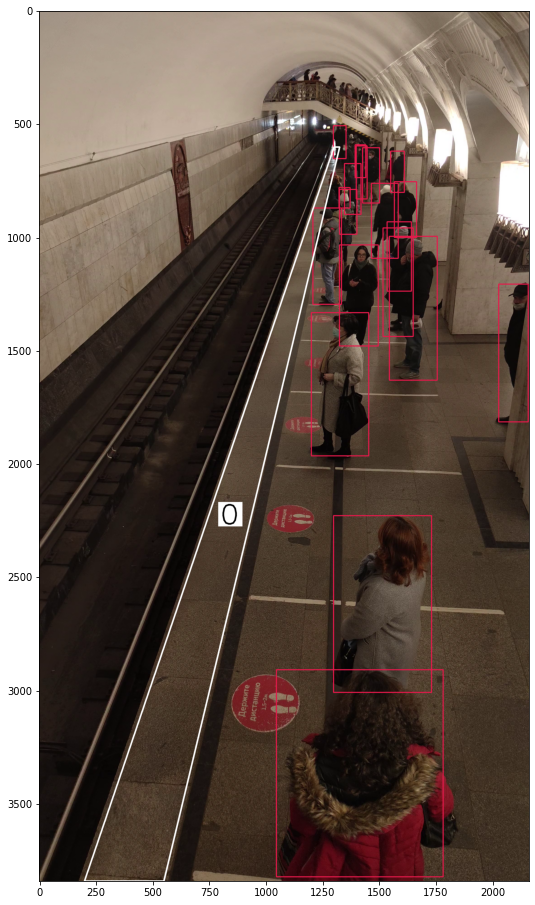

In [25]:
import numpy as np
import supervision as sv

# initiate polygon zone
polygon = np.array([
    [200, 3840],
    [1300, 600],
    [1325, 600],
    [550, 3840]
])
video_info = sv.VideoInfo.from_video_path(SUBWAY_VIDEO_PATH)
zone = sv.PolygonZone(polygon=polygon, frame_resolution_wh=video_info.resolution_wh)

# initiate annotators
box_annotator = sv.BoxAnnotator(thickness=4, text_thickness=4, text_scale=2)
zone_annotator = sv.PolygonZoneAnnotator(zone=zone, color=sv.Color.white(), thickness=6, text_thickness=6, text_scale=4)

# extract video frame
generator = sv.get_video_frames_generator(SUBWAY_VIDEO_PATH)
iterator = iter(generator)
frame = next(iterator)

# detect
outputs = predictor(frame)
detections = sv.Detections(
    xyxy=outputs["instances"].pred_boxes.tensor.cpu().numpy(),
    confidence=outputs["instances"].scores.cpu().numpy(),
    class_id=outputs["instances"].pred_classes.cpu().numpy().astype(int)
)
detections = detections[detections.class_id == 0]
zone.trigger(detections=detections)

# annotate
box_annotator = sv.BoxAnnotator(thickness=4, text_thickness=4, text_scale=2)
frame = box_annotator.annotate(scene=frame, detections=detections, skip_label=True)
frame = zone_annotator.annotate(scene=frame)

%matplotlib inline  
sv.show_frame_in_notebook(frame, (16, 16))

**NOTE:** Now let's process the whole video.

In [26]:
import numpy as np
import supervision as sv

# initiate polygon zone
polygon = np.array([
    [200, 3840],
    [1300, 600],
    [1325, 600],
    [550, 3840]
])
video_info = sv.VideoInfo.from_video_path(SUBWAY_VIDEO_PATH)
zone = sv.PolygonZone(polygon=polygon, frame_resolution_wh=video_info.resolution_wh)

# initiate annotators
box_annotator = sv.BoxAnnotator(thickness=4, text_thickness=4, text_scale=2)
zone_annotator = sv.PolygonZoneAnnotator(zone=zone, color=sv.Color.white(), thickness=6, text_thickness=6, text_scale=4)

def process_frame(frame: np.ndarray, i: int) -> np.ndarray:
    print('frame', i)
    # detect
    outputs = predictor(frame)
    detections = sv.Detections(
        xyxy=outputs["instances"].pred_boxes.tensor.cpu().numpy(),
        confidence=outputs["instances"].scores.cpu().numpy(),
        class_id=outputs["instances"].pred_classes.cpu().numpy().astype(int)
    )
    detections = detections[detections.class_id == 0]
    zone.trigger(detections=detections)

    # annotate
    box_annotator = sv.BoxAnnotator(thickness=4, text_thickness=4, text_scale=2)
    frame = box_annotator.annotate(scene=frame, detections=detections, skip_label=True)
    frame = zone_annotator.annotate(scene=frame)

    return frame

sv.process_video(source_path=SUBWAY_VIDEO_PATH, target_path=f"{HOME}/subway-result.mp4", callback=process_frame)

from IPython import display
display.clear_output()

## Advanced YOLOv5 Market Square Example

In [27]:
import torch # torch kütüphanesini import ediyoruz

model = torch.hub.load('ultralytics/yolov5', 'yolov5x6') # hub sınıfı pytorch içinde bulunan ön eğitimli modelleri barındıran bir sınıftır,
                                                         # ilk parametre github reposu, ikinci parametre modeldir

/usr/local/lib/python3.9/dist-packages/torch/hub.py:267: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
requirements: YOLOv5 requirement "setuptools>=65.5.1" not found, attempting AutoUpdate...
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/

requirements: 1 package updated per /root/.cache/torch/hub/u

  0%|          | 0.00/270M [00:00<?, ?B/s]


Fusing layers... 
YOLOv5x6 summary: 574 layers, 140730220 parameters, 0 gradients
Adding AutoShape... 


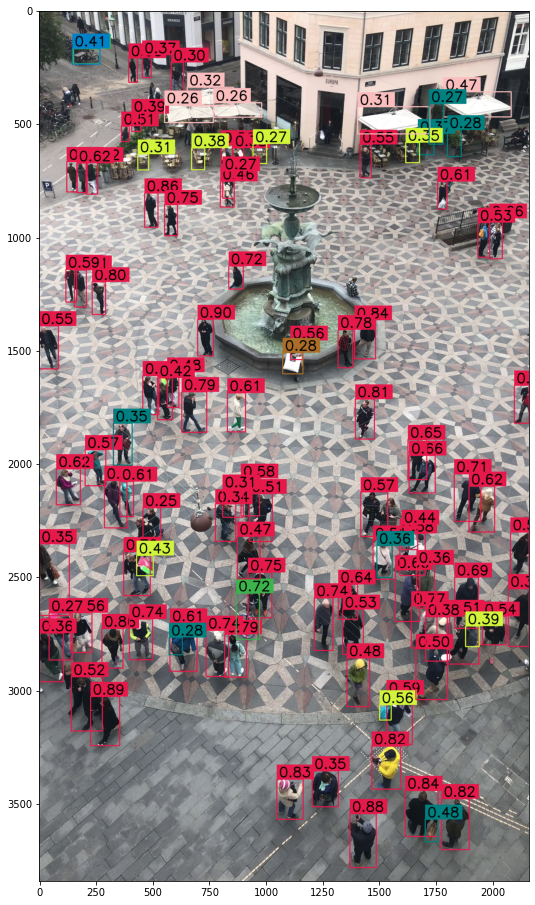

In [28]:
import supervision as sv

# extract video frame
generator = sv.get_video_frames_generator(MARKET_SQUARE_VIDEO_PATH)
iterator = iter(generator)
frame = next(iterator)

# detect
results = model(frame, size=1280)
detections = sv.Detections.from_yolov5(results)

# annotate
box_annotator = sv.BoxAnnotator(thickness=4, text_thickness=4, text_scale=2)
frame = box_annotator.annotate(scene=frame, detections=detections)

%matplotlib inline  
sv.show_frame_in_notebook(frame, (16, 16))

**NOTE:** Once again, we have a lot of excess detections that we are not interested in. Let us remove all those not belonging to the person class. At the same time (to show off), we can reject all detections not exceeding `0.5` confidence.

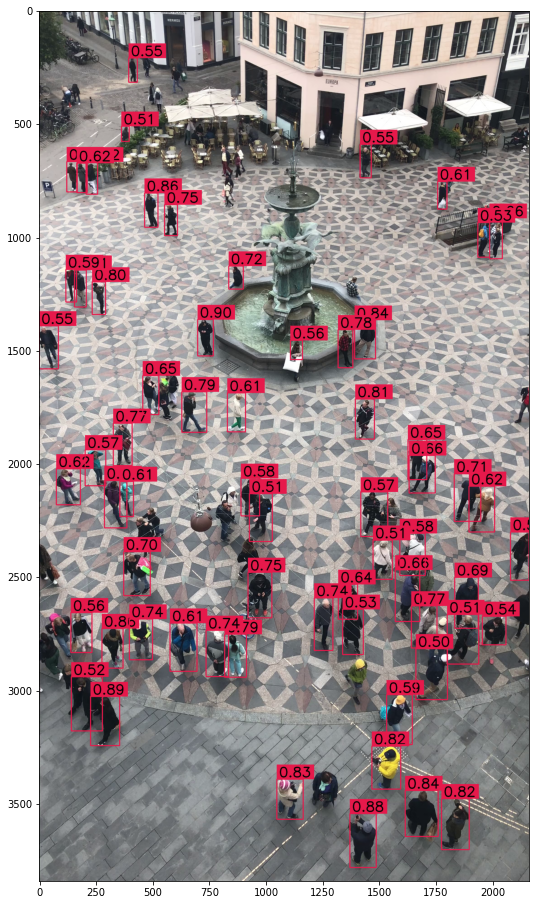

In [29]:
import supervision as sv

# extract video frame
generator = sv.get_video_frames_generator(MARKET_SQUARE_VIDEO_PATH)
iterator = iter(generator)
frame = next(iterator)

# detect
results = model(frame, size=1280)
detections = sv.Detections.from_yolov5(results)
detections = detections[(detections.class_id == 0) & (detections.confidence > 0.5)]

# annotate
box_annotator = sv.BoxAnnotator(thickness=4, text_thickness=4, text_scale=2)
frame = box_annotator.annotate(scene=frame, detections=detections)

%matplotlib inline  
sv.show_frame_in_notebook(frame, (16, 16))

In [30]:
len(detections)

64

**NOTE:** We can use `Detection` API to easly calculate how many people we see on the frame. But what if we would like to divide the Market Square into smaller zones and know how many people we see each zone.

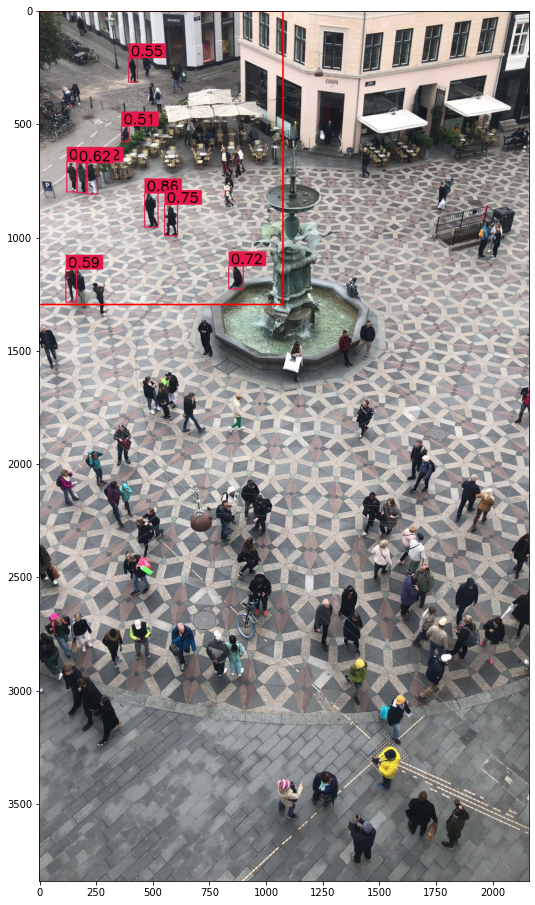

In [31]:
import numpy as np
import supervision as sv

# initiate polygon zone
polygon = np.array([
    [0, 0],
    [1080 - 5, 0],
    [1080 - 5, 1300 - 5],
    [0, 1300 - 5]
])
video_info = sv.VideoInfo.from_video_path(MARKET_SQUARE_VIDEO_PATH)
zone = sv.PolygonZone(polygon=polygon, frame_resolution_wh=video_info.resolution_wh)

# extract video frame
generator = sv.get_video_frames_generator(MARKET_SQUARE_VIDEO_PATH)
iterator = iter(generator)
frame = next(iterator)

# detect
results = model(frame, size=1280)
detections = sv.Detections.from_yolov5(results)
mask = zone.trigger(detections=detections)
detections = detections[(detections.class_id == 0) & (detections.confidence > 0.5) & mask]

# annotate
box_annotator = sv.BoxAnnotator(thickness=4, text_thickness=4, text_scale=2)
frame = box_annotator.annotate(scene=frame, detections=detections)
frame = sv.draw_polygon(scene=frame, polygon=polygon, color=sv.Color.red(), thickness=6)

%matplotlib inline  
sv.show_frame_in_notebook(frame, (16, 16))

**NOTE:** Importantly, zones can have a much more complex geometry. 

In [32]:
sv.VideoInfo.from_video_path(MARKET_SQUARE_VIDEO_PATH)

VideoInfo(width=2160, height=3840, fps=60, total_frames=474)

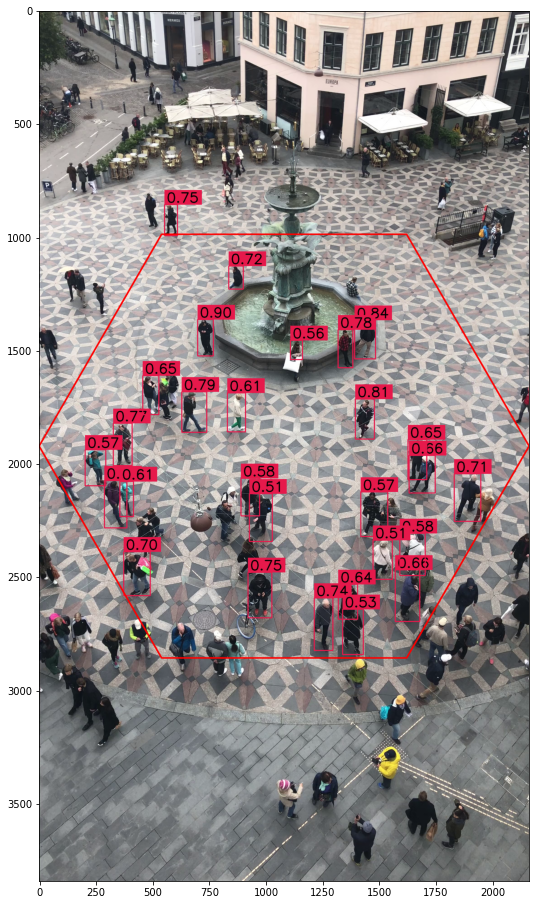

In [33]:
import numpy as np
import supervision as sv

# initiate polygon zone
polygon = np.array([
    [540,  985],
    [1620, 985],
    [2160, 1920],
    [1620, 2855],
    [540,  2855],
    [0,    1920]
])
video_info = sv.VideoInfo.from_video_path(MARKET_SQUARE_VIDEO_PATH)
zone = sv.PolygonZone(polygon=polygon, frame_resolution_wh=video_info.resolution_wh)

# extract video frame
generator = sv.get_video_frames_generator(MARKET_SQUARE_VIDEO_PATH)
iterator = iter(generator)
frame = next(iterator)

# detect
results = model(frame, size=1280)
detections = sv.Detections.from_yolov5(results)
mask = zone.trigger(detections=detections)
detections = detections[(detections.class_id == 0) & (detections.confidence > 0.5) & mask]

# annotate
box_annotator = sv.BoxAnnotator(thickness=4, text_thickness=4, text_scale=2)
frame = box_annotator.annotate(scene=frame, detections=detections)
frame = sv.draw_polygon(scene=frame, polygon=polygon, color=sv.Color.red(), thickness=6)

%matplotlib inline  
sv.show_frame_in_notebook(frame, (16, 16))

**NOTE:** We can also have more complex behaviours.

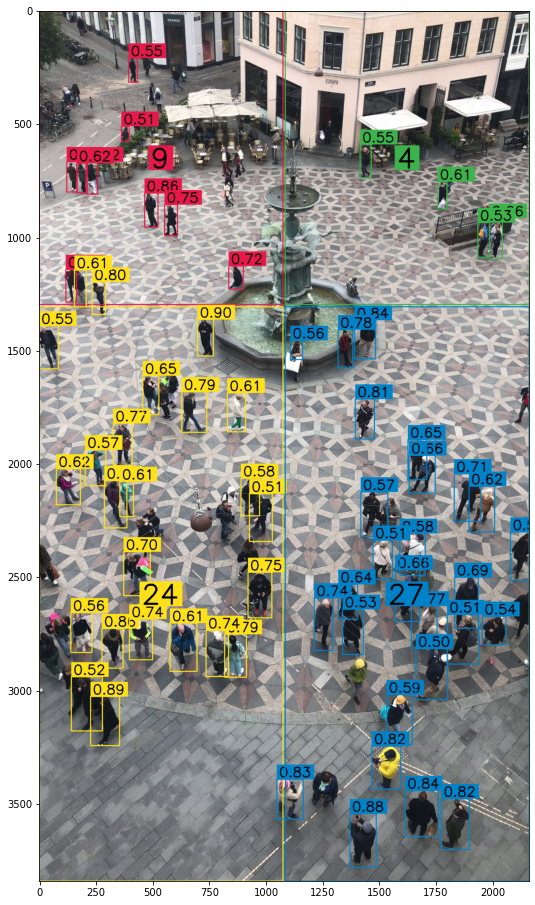

In [34]:
colors = sv.ColorPalette.default()
polygons = [
    np.array([
        [0, 0],
        [1080 - 5, 0],
        [1080 - 5, 1300 - 5],
        [0, 1300 - 5]
    ], np.int32), 
    np.array([
        [1080 + 5, 0],
        [2160, 0],
        [2160, 1300 - 5],
        [1080 + 5, 1300 - 5]
    ], np.int32), 
    np.array([
        [0, 1300 + 5],
        [1080 - 5, 1300 + 5],
        [1080 - 5, 3840],
        [0, 3840]
    ], np.int32), 
    np.array([
        [1080 + 5, 1300 + 5],
        [2160, 1300 + 5],
        [2160, 3840],
        [1080 + 5, 3840]
    ], np.int32)
]
video_info = sv.VideoInfo.from_video_path(MARKET_SQUARE_VIDEO_PATH)

zones = [
    sv.PolygonZone(
        polygon=polygon, 
        frame_resolution_wh=video_info.resolution_wh
    )
    for polygon
    in polygons
]
zone_annotators = [
    sv.PolygonZoneAnnotator(
        zone=zone, 
        color=colors.by_idx(index), 
        thickness=4,
        text_thickness=8,
        text_scale=4
    )
    for index, zone
    in enumerate(zones)
]
box_annotators = [
    sv.BoxAnnotator(
        color=colors.by_idx(index), 
        thickness=4, 
        text_thickness=4, 
        text_scale=2
        )
    for index
    in range(len(polygons))
]

# extract video frame
generator = sv.get_video_frames_generator(MARKET_SQUARE_VIDEO_PATH)
iterator = iter(generator)
frame = next(iterator)

# detect
results = model(frame, size=1280)
detections = sv.Detections.from_yolov5(results)
detections = detections[(detections.class_id == 0) & (detections.confidence > 0.5)]

for zone, zone_annotator, box_annotator in zip(zones, zone_annotators, box_annotators):
    mask = zone.trigger(detections=detections)
    detections_filtered = detections[mask]
    frame = box_annotator.annotate(scene=frame, detections=detections_filtered)
    frame = zone_annotator.annotate(scene=frame)

%matplotlib inline  
sv.show_frame_in_notebook(frame, (16, 16))

**NOTE:** Or we can go compleatly crazy.

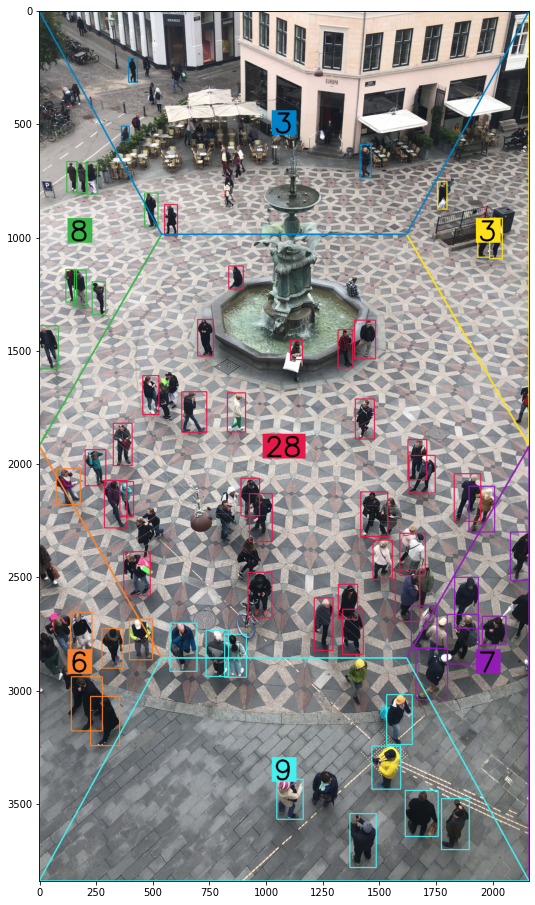

In [35]:
colors = sv.ColorPalette.default()
polygons = [
    np.array([
        [540,  985 ],
        [1620, 985 ],
        [2160, 1920],
        [1620, 2855],
        [540,  2855],
        [0,    1920]
    ], np.int32),
    np.array([
        [0,    1920],
        [540,  985 ],
        [0,    0   ]
    ], np.int32),
    np.array([
        [1620, 985 ],
        [2160, 1920],
        [2160,    0]
    ], np.int32),
    np.array([
        [540,  985 ],
        [0,    0   ],
        [2160, 0   ],
        [1620, 985 ]
    ], np.int32),
    np.array([
        [0,    1920],
        [0,    3840],
        [540,  2855]
    ], np.int32),
    np.array([
        [2160, 1920],
        [1620, 2855],
        [2160, 3840]
    ], np.int32),
    np.array([
        [1620, 2855],
        [540,  2855],
        [0,    3840],
        [2160, 3840]
    ], np.int32)
]
video_info = sv.VideoInfo.from_video_path(MARKET_SQUARE_VIDEO_PATH)

zones = [
    sv.PolygonZone(
        polygon=polygon, 
        frame_resolution_wh=video_info.resolution_wh
    )
    for polygon
    in polygons
]
zone_annotators = [
    sv.PolygonZoneAnnotator(
        zone=zone, 
        color=colors.by_idx(index), 
        thickness=6,
        text_thickness=8,
        text_scale=4
    )
    for index, zone
    in enumerate(zones)
]
box_annotators = [
    sv.BoxAnnotator(
        color=colors.by_idx(index), 
        thickness=4, 
        text_thickness=4, 
        text_scale=2
        )
    for index
    in range(len(polygons))
]

# extract video frame
generator = sv.get_video_frames_generator(MARKET_SQUARE_VIDEO_PATH)
iterator = iter(generator)
frame = next(iterator)

# detect
results = model(frame, size=1280)
detections = sv.Detections.from_yolov5(results)
detections = detections[(detections.class_id == 0) & (detections.confidence > 0.5)]

for zone, zone_annotator, box_annotator in zip(zones, zone_annotators, box_annotators):
    mask = zone.trigger(detections=detections)
    detections_filtered = detections[mask]
    frame = box_annotator.annotate(scene=frame, detections=detections_filtered, skip_label=True)
    frame = zone_annotator.annotate(scene=frame)

%matplotlib inline  
sv.show_frame_in_notebook(frame, (16, 16))

In [36]:
colors = sv.ColorPalette.default()
polygons = [
    np.array([
        [540,  985 ],
        [1620, 985 ],
        [2160, 1920],
        [1620, 2855],
        [540,  2855],
        [0,    1920]
    ], np.int32),
    np.array([
        [0,    1920],
        [540,  985 ],
        [0,    0   ]
    ], np.int32),
    np.array([
        [1620, 985 ],
        [2160, 1920],
        [2160,    0]
    ], np.int32),
    np.array([
        [540,  985 ],
        [0,    0   ],
        [2160, 0   ],
        [1620, 985 ]
    ], np.int32),
    np.array([
        [0,    1920],
        [0,    3840],
        [540,  2855]
    ], np.int32),
    np.array([
        [2160, 1920],
        [1620, 2855],
        [2160, 3840]
    ], np.int32),
    np.array([
        [1620, 2855],
        [540,  2855],
        [0,    3840],
        [2160, 3840]
    ], np.int32)
]
video_info = sv.VideoInfo.from_video_path(MARKET_SQUARE_VIDEO_PATH)

zones = [
    sv.PolygonZone(
        polygon=polygon, 
        frame_resolution_wh=video_info.resolution_wh
    )
    for polygon
    in polygons
]
zone_annotators = [
    sv.PolygonZoneAnnotator(
        zone=zone, 
        color=colors.by_idx(index), 
        thickness=6,
        text_thickness=8,
        text_scale=4
    )
    for index, zone
    in enumerate(zones)
]
box_annotators = [
    sv.BoxAnnotator(
        color=colors.by_idx(index), 
        thickness=4, 
        text_thickness=4, 
        text_scale=2
        )
    for index
    in range(len(polygons))
]

def process_frame(frame: np.ndarray, i) -> np.ndarray:
    print(i)
    # detect
    results = model(frame, size=1280)
    detections = sv.Detections.from_yolov5(results)
    detections = detections[(detections.class_id == 0) & (detections.confidence > 0.5)]

    for zone, zone_annotator, box_annotator in zip(zones, zone_annotators, box_annotators):
        mask = zone.trigger(detections=detections)
        detections_filtered = detections[mask]
        frame = box_annotator.annotate(scene=frame, detections=detections_filtered, skip_label=True)
        frame = zone_annotator.annotate(scene=frame)

    return frame

sv.process_video(source_path=MARKET_SQUARE_VIDEO_PATH, target_path=f"{HOME}/market-square-result.mp4", callback=process_frame)

from IPython import display
display.clear_output()

## 🏆 Congratulations

### Learning Resources

Roboflow has produced many resources that you may find interesting as you advance your knowledge of computer vision:

- [Roboflow Notebooks](https://github.com/roboflow/notebooks): A repository of over 20 notebooks that walk through how to train custom models with a range of model types, from YOLOv7 to SegFormer.
- [Roboflow YouTube](https://www.youtube.com/c/Roboflow): Our library of videos featuring deep dives into the latest in computer vision, detailed tutorials that accompany our notebooks, and more.
- [Roboflow Discuss](https://discuss.roboflow.com/): Have a question about how to do something on Roboflow? Ask your question on our discussion forum.
- [Roboflow Models](https://roboflow.com): Learn about state-of-the-art models and their performance. Find links and tutorials to guide your learning.

### Convert data formats

Roboflow provides free utilities to convert data between dozens of popular computer vision formats. Check out [Roboflow Formats](https://roboflow.com/formats) to find tutorials on how to convert data between formats in a few clicks.

### Connect computer vision to your project logic

[Roboflow Templates](https://roboflow.com/templates) is a public gallery of code snippets that you can use to connect computer vision to your project logic. Code snippets range from sending emails after inference to measuring object distance between detections.